# パラメータ

In [ ]:
# パラメータ
voice_data_folder = './sample_voice'  # 確認用wavファイルを設置したディレクトリを指定

# 実行準備

In [2]:
%matplotlib inline

import IPython.display as display
import matplotlib.pyplot as plt

import numpy as np
from scipy.io import wavfile
import pyworld as pw
import glob
from PIL import Image
from PIL import ImageFilter
import librosa
import pathlib

In [12]:
#参考：https://qiita.com/index_30/items/62a044f93627edeed81f
voice_files =[x for x in pathlib.Path(voice_data_folder).glob("*") if x.suffix in [".ogg",".wav"]]

print('path : '+",".join([str(x) for x in voice_files])+"\r\n")

VOICE_FILE = voice_files[0]
fs, data = wavfile.read(VOICE_FILE)
data = data.astype(np.float)

path : sample_voice\yuduki-yukari_ATR503_001.wav



# 実験


## Worldによる音声変換

-------------- 元データ --------------


元の波形


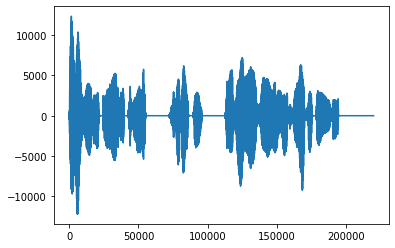

基本周波数


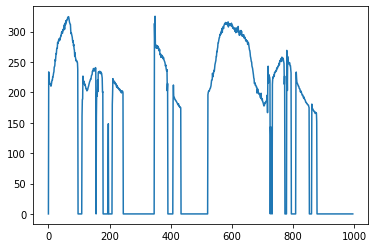

スペクトル包絡


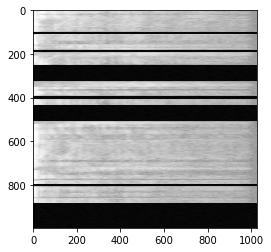

非周期性指標


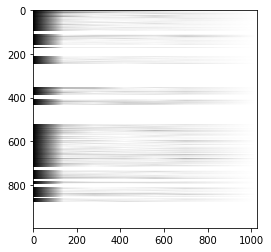

合成して復元


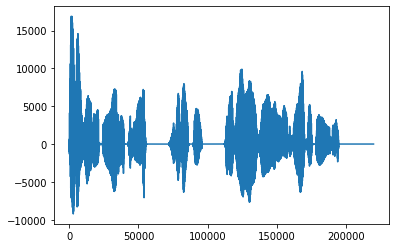

-------------- 基本周波数を中央値に固定 --------------
基本周波数


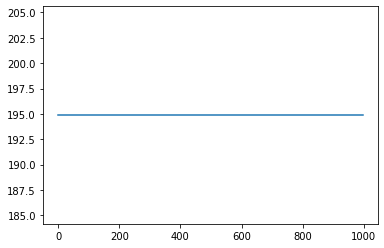

 - 抑揚が乏しくなる
 - 声の高さはほぼ同じ
-------------- 基本周波数を０に固定 --------------
基本周波数


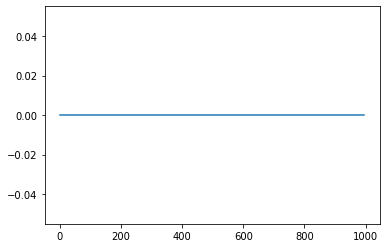

 - しゃがれた声になる
-------------- 基本周波数を２倍 --------------
基本周波数


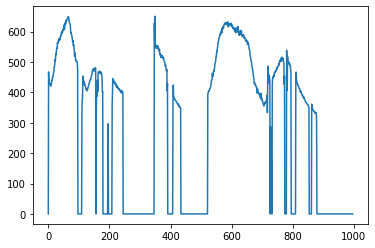

 - 高い声
-------------- 基本周波数を０．５倍 --------------
基本周波数


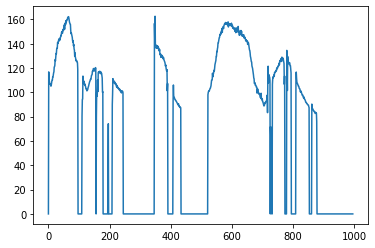

 - 低い声
-------------- 基本周波数を1/16倍 --------------
基本周波数


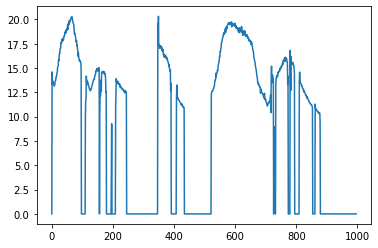

 - 低い声
--------------　基本周波数に正規分布ノイズを追加 --------------
基本周波数


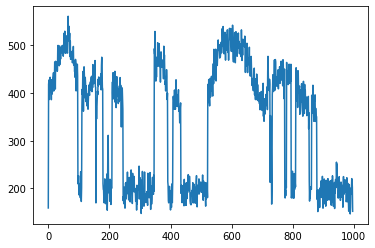

 - ふるえた声になる
-------------- スペクトル包絡を中央値に固定 --------------
スペクトル包絡


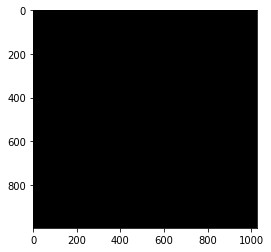

 - 発話内容がわからなくなる
-------------- スペクトル包絡を０に固定 --------------
スペクトル包絡


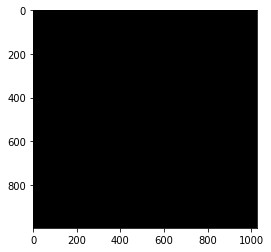

 - 音声なし
-------------- スペクトル包絡を1e-6倍 --------------
スペクトル包絡


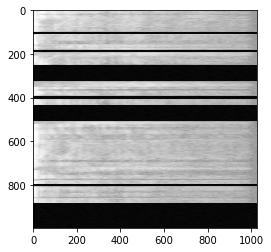

 - ほとんど変わらない
-------------- スペクトル包絡を10倍 --------------
スペクトル包絡


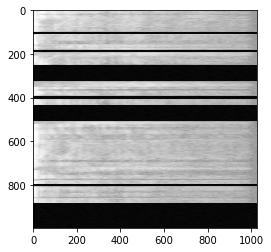

 - ほとんど変わらない
--------------　スペクトル包絡に正規分布ノイズを追加 --------------
スペクトル包絡


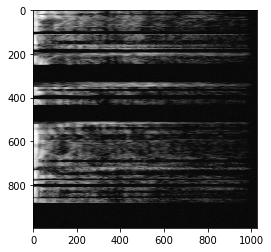

 - ほとんど変わらない
--------------　スペクトル包絡を画像化してガウスぼかし --------------
スペクトル包絡　オリジナル


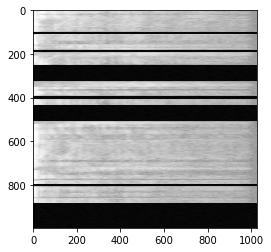

スペクトル包絡　ガウスぼかし後


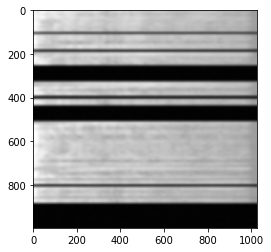

 - しゃがれた声になる
 - あいまいな発声になり、発話内容が聞き取りにくくなる
-------------- 非周期性指標を中央値に固定 --------------
非周期性指標


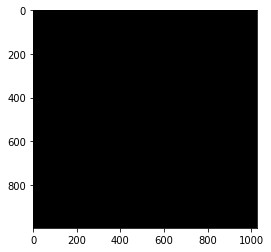

 - しゃがれた声になる
-------------- 非周期性指標を０に固定 --------------
非周期性指標


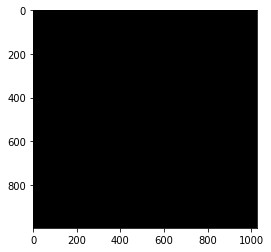


- ほとんど変わらない

-------------- 非周期性指標を０に固定 --------------
非周期性指標


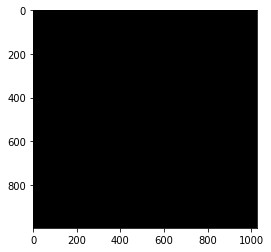

 - ほとんど変わらない
--------------　非周期性指標に正規分布ノイズを追加 --------------
非周期性指標


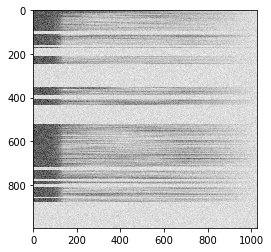

 - しゃがれた声になる


In [16]:
# print('path : '+wavePath+"\r\n")
path_list = glob.glob(wavePath)

VOICE_FILE = path_list[0]

# print("""---------------------------------------------------------------------
# {} に対して基本周波数F0、スペクトル包絡SP、非周期性指標APを推定して、
# 各パラメータを変化させて音声を再合成（synthesize）したときの音声を出力します。
# ---------------------------------------------------------------------
# """.format(VOICE_FILE))


fs, data = wavfile.read(VOICE_FILE)
data = data.astype(np.float)

_f0, t = pw.dio(data, fs)  # 基本周波数の抽出
f0 = pw.stonemask(data, _f0, t, fs)  # 基本周波数の修正
sp = pw.cheaptrick(data, f0, t, fs)  # スペクトル包絡の抽出
ap = pw.d4c(data, f0, t, fs)  # 非周期性指標の抽出

f0_median = np.median(f0)
f0_noised = f0 + np.random.normal(f0_median,f0_median/10,f0.shape)
sp_median = np.median(sp)
sp_noised = sp + np.random.normal(sp_median,sp_median/10,sp.shape)
ap_median = np.median(ap)
ap_noised = ap + np.random.normal(ap_median,ap_median/10,ap.shape)

print("-------------- 元データ --------------")
display.display(
    display.Audio(data, rate=fs)
)
print("元の波形")
plt.plot(data)
plt.show()
print("基本周波数")
plt.plot(f0)
plt.show()
print("スペクトル包絡")
plt.imshow(np.log(sp), cmap='gray')
plt.show()
print("非周期性指標")
plt.imshow(np.log(ap), cmap='gray')
plt.show()
print("合成して復元")
synthesized = pw.synthesize(f0, sp, ap, fs)
plt.plot(synthesized)
plt.show()
display.display(
    display.Audio(synthesized, rate=fs)
)

print("-------------- 基本周波数を中央値に固定 --------------")
f0_1 = np.ones_like(f0)*f0_median
synthesized_f0 = pw.synthesize(f0_1, sp, ap, fs)
print("基本周波数")
plt.plot(f0_1)
plt.show()
display.display(
    display.Audio(synthesized_f0, rate=fs)
)
print(" - 抑揚が乏しくなる")
print(" - 声の高さはほぼ同じ")

print("-------------- 基本周波数を０に固定 --------------")
f0_fixed0 = np.zeros(f0.shape)
synthesized_f0_0 = pw.synthesize(f0_fixed0, sp, ap, fs)
print("基本周波数")
plt.plot(f0_fixed0)
plt.show()
display.display(
    display.Audio(synthesized_f0_0, rate=fs)
)
print(" - しゃがれた声になる")

print("-------------- 基本周波数を２倍 --------------")
f0_mul2 = f0*2
synthesized_f0_mul2= pw.synthesize(f0_mul2, sp, ap, fs)
print("基本周波数")
plt.plot(f0_mul2)
plt.show()
display.display(
    display.Audio(synthesized_f0_mul2, rate=fs)
)
print(" - 高い声")

print("-------------- 基本周波数を０．５倍 --------------")
f0_mul05 = f0*0.5
synthesized_f0_mul05= pw.synthesize(f0_mul05, sp, ap, fs)
print("基本周波数")
plt.plot(f0_mul05)
plt.show()
display.display(
    display.Audio(synthesized_f0_mul05, rate=fs)
)
print(" - 低い声")

print("-------------- 基本周波数を1/16倍 --------------")
f0_mul0116 = f0/16
synthesized_f0_mul0116= pw.synthesize(f0_mul0116, sp, ap, fs)
print("基本周波数")
plt.plot(f0_mul0116)
plt.show()
display.display(
    display.Audio(synthesized_f0_mul0116, rate=fs)
)
print(" - 低い声")


print("--------------　基本周波数に正規分布ノイズを追加 --------------")
synthesized_f0noised = pw.synthesize(f0_noised, sp, ap, fs)
print("基本周波数")
plt.plot(f0_noised)
plt.show()
display.display(
    display.Audio(synthesized_f0noised, rate=fs)
)
print(" - ふるえた声になる")

print("-------------- スペクトル包絡を中央値に固定 --------------")
sp_1 =  np.ones_like(sp)*sp_median
synthesized_sp = pw.synthesize(f0,sp_1, ap, fs)
print("スペクトル包絡")
plt.imshow(np.log(sp_1), cmap='gray')
plt.show()
display.display(
    display.Audio(synthesized_sp, rate=fs)
)
print(" - 発話内容がわからなくなる")

print("-------------- スペクトル包絡を０に固定 --------------")
sp_fixed0 = np.zeros(sp.shape)
synthesized_sp0 = pw.synthesize(f0, sp_fixed0, ap, fs)
print("スペクトル包絡")
plt.imshow(sp_fixed0, cmap='gray')
plt.show()
display.display(
    display.Audio(synthesized_sp0, rate=fs)
)
print(" - 音声なし")

print("-------------- スペクトル包絡を1e-6倍 --------------")
sp_mul000001 = sp*0.000001 # + np.random.normal(sp_median,sp_median/2,sp.shape)
synthesized_sp_mul000001 = pw.synthesize(f0, sp_mul000001, ap, fs)
print("スペクトル包絡")
plt.imshow(np.log(sp_mul000001), cmap='gray')
plt.show()
display.display(
    display.Audio(synthesized_sp_mul000001, rate=fs)
)
print(" - ほとんど変わらない")

print("-------------- スペクトル包絡を10倍 --------------")
sp_mul10 = sp*10 # + np.random.normal(sp_median,sp_median/2,sp.shape)
synthesized_sp_mul10 = pw.synthesize(f0, sp_mul10, ap, fs)
print("スペクトル包絡")
plt.imshow(np.log(sp_mul10), cmap='gray')
plt.show()
display.display(
    display.Audio(synthesized_sp_mul10, rate=fs)
)
print(" - ほとんど変わらない")

print("--------------　スペクトル包絡に正規分布ノイズを追加 --------------")
synthesized_spNoised = pw.synthesize(f0, sp_noised, ap, fs)
print("スペクトル包絡")
plt.imshow(np.log(sp_noised), cmap='gray')
plt.show()
display.display(
    display.Audio(synthesized_spNoised, rate=fs)
)
print(" - ほとんど変わらない")

print("--------------　スペクトル包絡を画像化してガウスぼかし --------------")
ap_fixed0 = np.zeros(ap.shape)
offset = np.abs( np.min(np.log(sp)))
rectified = np.log(sp) + offset
max = np.max(rectified)
norm_coefficient = 255 / max
sp_image = Image.fromarray(np.uint8(rectified*norm_coefficient))
gaussianBlurImg5 = sp_image.filter(ImageFilter.GaussianBlur(5.0))
sp2 = np.exp(np.asarray(gaussianBlurImg5) / norm_coefficient - offset)
synthesized_gaussian5 = pw.synthesize(f0_fixed0, sp2, ap_fixed0, fs)
print("スペクトル包絡　オリジナル")
plt.imshow(np.log(sp), cmap='gray')
plt.show()
print("スペクトル包絡　ガウスぼかし後")
plt.imshow(np.log(sp2), cmap='gray')
plt.show()
display.display(
    display.Audio(synthesized_gaussian5, rate=fs)
)
print(" - しゃがれた声になる")
print(" - あいまいな発声になり、発話内容が聞き取りにくくなる")

print("-------------- 非周期性指標を中央値に固定 --------------")
ap_1 = np.ones_like(ap)*ap_median
synthesized_ap = pw.synthesize(f0,sp,ap_1, fs)
print("非周期性指標")
plt.imshow(np.log(ap_1), cmap='gray')
plt.show()
display.display(
    display.Audio(synthesized_ap, rate=fs)
)
print(" - しゃがれた声になる")

print("-------------- 非周期性指標を０に固定 --------------")
ap_2 = np.zeros_like(ap)
synthesized_ap2 = pw.synthesize(f0,sp,ap_2, fs)
print("非周期性指標")
plt.imshow(ap_2, cmap='gray')  # np.log(ap_2) だとlog0となり警告が出た
plt.show()
display.display(
    display.Audio(synthesized_ap2, rate=fs)
)
print("""
- ほとんど変わらない
""")
# print("文献的には擦過音が表現できなくなる")

print("-------------- 非周期性指標を０に固定 --------------")
synthesized_ap0 = pw.synthesize(f0, sp, ap_fixed0, fs)
print("非周期性指標")
plt.imshow(ap_fixed0, cmap='gray')
plt.show()
display.display(
    display.Audio(synthesized_ap0, rate=fs)
)
print(" - ほとんど変わらない")

print("--------------　非周期性指標に正規分布ノイズを追加 --------------")
synthesized_apNoised = pw.synthesize(f0,sp,ap_noised, fs)
print("非周期性指標")
plt.imshow(np.log(ap_noised), cmap='gray')
plt.show()
display.display(
    display.Audio(synthesized_apNoised, rate=fs)
)
print(" - しゃがれた声になる")

## World まとめ
Worldによって抽出された音響特徴量が影響を与える要素
- 基本周波数：声の高さ、抑揚
- スペクトル包絡：発話内容、声質
- 非周期性指標：声質


## スペクトログラムによる音声変換

-------------- 元の音声データ --------------


元の波形


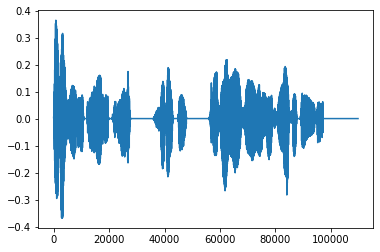

強度のスペクトログラム


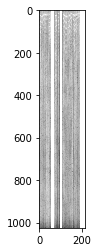

位相のスペクトログラム


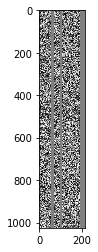

スペクトログラムから波形を復元


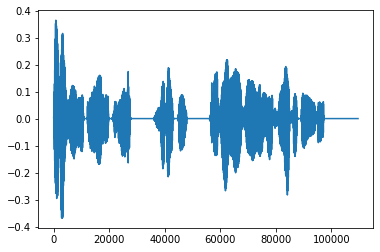

-------------- 強度スペクトログラムのみから復元 --------------


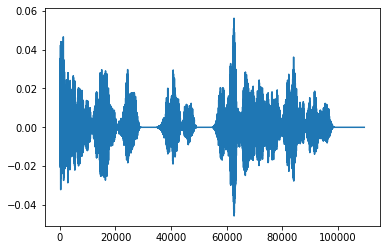

- 複数人が同時に話しているような効果
- 発話内容は聞き取れる
-------------- オリジナルの強度とランダムな位相スペクトログラムから復元 --------------
位相のスペクトログラム


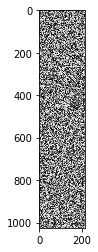

- 複数人が同時に話しているような効果
- 発話内容は聞き取れる
-------------- 強度スペクトログラムをガウスぼかし後、強度・位相から復元 --------------
強度のスペクトログラム


C:\Users\Chilly.Ice-desktop\Anaconda3\envs\py36-audio\lib\site-packages\ipykernel_launcher.py:68: RuntimeWarning: divide by zero encountered in log


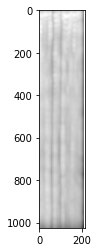

- エコーのような効果
- 発話内容は聞き取れる


In [18]:
import scipy.ndimage.filters

y, sr = librosa.load(path_list[0])
# display.display(
#     display.Audio(y, rate=fs)
# )
D = librosa.stft(y)
Dabs = np.abs(D)
Dphase = np.angle(D)
D = np.log(Dabs)

print("-------------- 元の音声データ --------------")
display.display(
    display.Audio(y, rate=fs)
)
print("元の波形")
plt.plot(y)
plt.show()
print("強度のスペクトログラム")
# plt.imshow(D,cmap='gray')
# plt.show()
plt.imshow(np.log(Dabs),cmap='gray')
plt.show()
print("位相のスペクトログラム")
plt.imshow(Dphase,cmap='gray')
plt.show()

print("スペクトログラムから波形を復元")
D_hat = Dabs * np.exp(1j*Dphase)
y_hat = librosa.istft(D_hat)
# y_hat = librosa.istft(D)
plt.plot(y_hat)
plt.show()
display.display(
    display.Audio(y_hat, rate=sr)
)

print("-------------- 強度スペクトログラムのみから復元 --------------")
y_hat_abs = librosa.istft(Dabs)
plt.plot(y_hat_abs)
plt.show()
display.display(
    display.Audio(y_hat_abs, rate=sr)
)
print("- 複数人が同時に話しているような効果")
print("- 発話内容は聞き取れる")

print("-------------- オリジナルの強度とランダムな位相スペクトログラムから復元 --------------")
p = 2 * np.pi * np.random.uniform(size=D.shape) - np.pi #-π ~ π の一様分布
D_hat_uniform = Dabs * np.exp(1j * p)
y_hat_uniform = librosa.istft(D_hat_uniform)
print("位相のスペクトログラム")
plt.imshow(p,cmap='gray')
# plt.plot(y_hat_uniform)
plt.show()
display.display(
    display.Audio(y_hat_uniform, rate=sr)
)
print("- 複数人が同時に話しているような効果")
print("- 発話内容は聞き取れる")


print("-------------- 強度スペクトログラムをガウスぼかし後、強度・位相から復元 --------------")
Dabs_gauss = scipy.ndimage.filters.gaussian_filter(Dabs,5)
D_hat_gauss = Dabs_gauss * np.exp(1j * Dphase)
y_hat_gauss = librosa.istft(D_hat_gauss)
print("強度のスペクトログラム")
plt.imshow(np.log(Dabs_gauss),cmap='gray')
plt.show()
display.display(
    display.Audio(y_hat_gauss, rate=sr)
)
print("- エコーのような効果")
print("- 発話内容は聞き取れる")

## スペクトログラム　まとめ
- 位相情報を捨てても発話内容は保持されるが、声質は復元できない。
- 音声認識の場合は位相の除去は考慮に値するが、音声合成の場合は位相情報が必要と思われる。